# Julia notebook for the analytics of the multilevel selection Wright-Fisher process

**First, we will start with some preliminaries about matrix exponentiation and logarithms in order to bring the Wright-Fisher to a form where the Campbell-Baker-Hausdorf formula can be applied**

In [1]:
#Required packages
using Distributions
using Combinatorics
using DataFrames
using LinearAlgebra
using Plots

#Function to generate the state space
function states(state_vec)
	state_zero = collect(permutations(state_vec[1]))
	for i=1:length(state_vec)
		additional=collect(permutations(state_vec[i]))
		state_zero=append!(state_zero,additional)
	end
	state_zero=unique(state_zero)
	return state_zero
end

function multinomial2(k)
    s = 0
    result = 1
    @inbounds for i in k
        s += i
        result *= binomial(BigInt(s), i)
    end
    result
end
#CBH formula to third order

function commute_mat(A,B)
    com=A*B-B*A
    return com
end

function CBH(A,B)
    Z=A+B+1/2*commute_mat(A,B)+1/12*(commute_mat(A,commute_mat(A,B))+commute_mat(B,commute_mat(B,A)))
    return Z
end

#Lets start defining a fitness function, 
# in the packge model literature is costumary to make use of the geometric average.
function gmean(A::Array{Int64,1})
	# geometric average of a vector
	#value=prod(A)^(1/length(A))
    value=A[1]/sum(A)*(1-A[1]/sum(A))
	return value
    end;
    #value of the transition matrix

function t_ij(u,v)
    #probability from state u to state v
    p=deepcopy(u)/sum(u)
    prob=multinomial2(v)*prod(p.^v)
    prob=convert(Float64,prob)
    return prob
end


function T_construct(N::Int64,seqtypes::Int64)
    state_vec=collect(partitions(N+seqtypes,seqtypes))-1
    state_zero=states(state_vec)
    state_zero=sort(state_zero, lt=(x,y)->isless(x[1], y[1]))
    T=[t_ij(state_zero[i],state_zero[j]) for i in 1:length(state_zero), j in 1:length(state_zero)]
    return T
end
    

T_construct (generic function with 1 method)

# Example of Perrof-Frobenius Iteration

We kick our example with a Protocell of two sequence types, the geometric average protocell level fitness and neutral at the sequence level.

In [3]:
#Parameters
N=15;
seqtypes=2;

#State space
state_vec=collect(partitions(N+seqtypes,seqtypes))-1
state_zero=states(state_vec)
state_zero=sort(state_zero, lt=(x,y)->isless(x[1], y[1]))

┌ Warning: `a::AbstractArray - b::Number` is deprecated, use `a .- b` instead.
│   caller = top-level scope at In[3]:4
└ @ Core In[3]:4
┌ Warning: `a::AbstractArray - b::Number` is deprecated, use `a .- b` instead.
│   caller = _broadcast_getindex_evalf at broadcast.jl:574 [inlined]
└ @ Core ./broadcast.jl:574
┌ Warning: `a::AbstractArray - b::Number` is deprecated, use `a .- b` instead.
│   caller = _broadcast_getindex_evalf at broadcast.jl:574 [inlined]
└ @ Core ./broadcast.jl:574


16-element Array{Array{Int64,1},1}:
 [0, 15]
 [1, 14]
 [2, 13]
 [3, 12]
 [4, 11]
 [5, 10]
 [6, 9] 
 [7, 8] 
 [8, 7] 
 [9, 6] 
 [10, 5]
 [11, 4]
 [12, 3]
 [13, 2]
 [14, 1]
 [15, 0]

We construct the fitness diagonal matrix

In [6]:
# Fitness function
function gmean(A::Array{Int64,1})
	# geometric average of a vector
	#value=prod(A)^(1/length(A))
    value=A[1]/sum(A)*(1-A[1]/sum(A))
    if value == 0
        value = 0
    end
	return value
    end;
w=[gmean(state_zero[i]) for i in 1:length(state_zero)]
W=Diagonal(w)

16×16 Diagonal{Real,Array{Real,1}}:
 0  ⋅          ⋅         ⋅     ⋅         …  ⋅     ⋅         ⋅          ⋅
 ⋅  0.0622222  ⋅         ⋅     ⋅            ⋅     ⋅         ⋅          ⋅
 ⋅  ⋅          0.115556  ⋅     ⋅            ⋅     ⋅         ⋅          ⋅
 ⋅  ⋅          ⋅         0.16  ⋅            ⋅     ⋅         ⋅          ⋅
 ⋅  ⋅          ⋅         ⋅     0.195556     ⋅     ⋅         ⋅          ⋅
 ⋅  ⋅          ⋅         ⋅     ⋅         …  ⋅     ⋅         ⋅          ⋅
 ⋅  ⋅          ⋅         ⋅     ⋅            ⋅     ⋅         ⋅          ⋅
 ⋅  ⋅          ⋅         ⋅     ⋅            ⋅     ⋅         ⋅          ⋅
 ⋅  ⋅          ⋅         ⋅     ⋅            ⋅     ⋅         ⋅          ⋅
 ⋅  ⋅          ⋅         ⋅     ⋅            ⋅     ⋅         ⋅          ⋅
 ⋅  ⋅          ⋅         ⋅     ⋅         …  ⋅     ⋅         ⋅          ⋅
 ⋅  ⋅          ⋅         ⋅     ⋅            ⋅     ⋅         ⋅          ⋅
 ⋅  ⋅          ⋅         ⋅     ⋅            0.16  ⋅         ⋅          ⋅
 ⋅  ⋅          

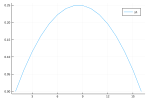

In [9]:
plot(w)

We construct the transition matrix

In [7]:
T_construct(N,seqtypes)
T=[t_ij(state_zero[i],state_zero[j]) for i in 1:length(state_zero), j in 1:length(state_zero)]

┌ Warning: `a::AbstractArray - b::Number` is deprecated, use `a .- b` instead.
│   caller = T_construct(::Int64, ::Int64) at In[1]:60
└ @ Main ./In[1]:60


16×16 Array{Float64,2}:
 1.0          0.0          0.0          …  0.0          0.0        
 0.355264     0.38064      0.19032         4.79568e-16  2.28366e-18
 0.116891     0.269749     0.290499        7.29601e-12  7.48309e-14
 0.0351844    0.131941     0.230897        1.96608e-9   3.2768e-11 
 0.00953941   0.0520331    0.132448        1.01147e-7   2.45206e-9 
 0.00228366   0.0171274    0.059946     …  2.09075e-6   6.96917e-8 
 0.000470185  0.00470185   0.021942        2.41592e-5   1.07374e-6 
 8.03491e-5   0.00105458   0.00645931      0.00018586   1.08418e-5 
 1.08418e-5   0.00018586   0.00148688      0.00105458   8.03491e-5 
 1.07374e-6   2.41592e-5   0.000253672     0.00470185   0.000470185
 6.96917e-8   2.09075e-6   2.92705e-5   …  0.0171274    0.00228366 
 2.45206e-9   1.01147e-7   1.94709e-6      0.0520331    0.00953941 
 3.2768e-11   1.96608e-9   5.50502e-8      0.131941     0.0351844  
 7.48309e-14  7.29601e-12  3.31969e-10     0.269749     0.116891   
 2.28366e-18  4.79568e-1

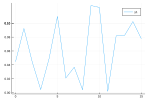

In [8]:
# initialize
v0 = rand(16)
v1 = v0/sum(v0)
plot(0:15,v1)

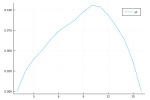

In [11]:
# After an iteration
v2 = W*T*v1
v3 =v2/sum(v2)
plot(v3)

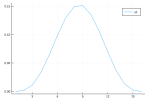

In [16]:
v1 = v3
v2 = W*T*v1
v3 =v2/sum(v2)
plot(v3)

**CBH example**

In [3]:
#For two matrices
A=[0.3 0;0 0.2]
B=[0.6 0.5;0.4 0.5]

2×2 Array{Float64,2}:
 0.6  0.5
 0.4  0.5

In [4]:
#Make sure they do not commute
commute_mat(A,B)

2×2 Array{Float64,2}:
  0.0   0.05
 -0.04  0.0 

In [5]:
#Calculate the CBH matrix 
Z=CBH(log(A),log(B))

2×2 Array{Complex{Float64},2}:
 -2.13888+0.0im   1.54502+0.0im
 0.821074+0.0im  -2.97712+0.0im

In [18]:
eigvecs(A*B)

Add `using LinearAlgebra` to your imports.
  likely near /Users/pechuanj/.julia/packages/IJulia/fjEtl/src/kernel.jl:41


2×2 Array{Float64,2}:
 0.890549  -0.691681
 0.454887   0.722203

In [19]:
eigvecs(Z)

Add `using LinearAlgebra` to your imports.
  likely near /Users/pechuanj/.julia/packages/IJulia/fjEtl/src/kernel.jl:41


2×2 Array{Complex{Float64},2}:
 0.892074+0.0im  -0.689964+0.0im
 0.451889-0.0im   0.723844+0.0im

In [20]:
#Study the eigenvectors
eigvecs(*(A,B))

Add `using LinearAlgebra` to your imports.
  likely near /Users/pechuanj/.julia/packages/IJulia/fjEtl/src/kernel.jl:41


2×2 Array{Float64,2}:
 0.890549  -0.691681
 0.454887   0.722203

In [21]:
eigvecs(expm(B))

┌ Warning: `expm` is deprecated, use `exp` instead.
│   caller = top-level scope at In[21]:1
└ @ Core In[21]:1
Add `using LinearAlgebra` to your imports.
  likely near /Users/pechuanj/.julia/packages/IJulia/fjEtl/src/kernel.jl:41


2×2 Array{Float64,2}:
 0.780869  -0.707107
 0.624695   0.707107

# logTij equivalence to the differential operator in Kimura

The state space of the protocell model is are the solutions to the Diophantine equations x+y=N where N is the ploidy. Here is a way of generating it.

In [17]:
Z=real(logm(T))

┌ Warning: `logm` is deprecated, use `log` instead.
│   caller = top-level scope at In[17]:1
└ @ Core In[17]:1


16×16 Array{Float64,2}:
  0.0           0.0           0.0          …   0.0           0.0        
  0.584804     -1.30313       0.892834         1.72897e-7   -9.51507e-9 
 -0.0204305     1.14392      -2.4691          -9.15245e-7    4.99838e-8 
  0.00193229   -0.0635085     1.67197          3.12531e-6   -1.70807e-7 
 -0.000322873   0.00848683   -0.131196        -8.49966e-6    4.60546e-7 
  7.97733e-5   -0.0018603     0.0230956    …   2.01756e-5   -1.07973e-6 
 -2.60915e-5    0.00056471   -0.00625402      -4.39314e-5    2.32744e-6 
  1.04834e-5   -0.000213571   0.00219451       9.36028e-5   -4.83117e-6 
 -4.83117e-6    9.36028e-5   -0.000902676     -0.000213571   1.04834e-5 
  2.32744e-6   -4.39314e-5    0.000405087      0.00056471   -2.60915e-5 
 -1.07973e-6    2.01756e-5   -0.00018255   …  -0.0018603     7.97733e-5 
  4.60546e-7   -8.49966e-6    7.6092e-5        0.00848683   -0.000322873
 -1.70807e-7    3.12531e-6   -2.76158e-5      -0.0635085     0.00193229 
  4.99838e-8   -9.15245e-7 

In [18]:
Tridiagonal(Z)

16×16 Tridiagonal{Float64,Array{Float64,1}}:
 0.0        0.0        ⋅          ⋅       …    ⋅          ⋅        ⋅      
 0.584804  -1.30313   0.892834    ⋅            ⋅          ⋅        ⋅      
  ⋅         1.14392  -2.4691     1.66235       ⋅          ⋅        ⋅      
  ⋅          ⋅        1.67197   -3.48756       ⋅          ⋅        ⋅      
  ⋅          ⋅         ⋅         2.16137       ⋅          ⋅        ⋅      
  ⋅          ⋅         ⋅          ⋅       …    ⋅          ⋅        ⋅      
  ⋅          ⋅         ⋅          ⋅            ⋅          ⋅        ⋅      
  ⋅          ⋅         ⋅          ⋅            ⋅          ⋅        ⋅      
  ⋅          ⋅         ⋅          ⋅            ⋅          ⋅        ⋅      
  ⋅          ⋅         ⋅          ⋅            ⋅          ⋅        ⋅      
  ⋅          ⋅         ⋅          ⋅       …    ⋅          ⋅        ⋅      
  ⋅          ⋅         ⋅          ⋅            ⋅          ⋅        ⋅      
  ⋅          ⋅         ⋅          ⋅           1.67197  

In [19]:
diagind(Z)
mean(Z[diagind(Z)])
Z[diagind(Z)]

16-element Array{Float64,1}:
  0.0               
 -1.3031270424783463
 -2.4690979873570837
 -3.4875570272828087
 -4.345612182558059 
 -5.025733495120448 
 -5.503900808198192 
 -5.752755708978085 
 -5.752755708977334 
 -5.503900808196699 
 -5.025733495119355 
 -4.345612182557635 
 -3.4875570272827137
 -2.469097987357074 
 -1.3031270424783465
  0.0               

In [20]:
d=-2*ones(length(state_zero))
dl=ones(length(state_zero)-1)
du=ones(length(state_zero)-1)
D=Tridiagonal(dl, d, du)

16×16 Tridiagonal{Float64,Array{Float64,1}}:
 -2.0   1.0    ⋅     ⋅     ⋅     ⋅   …    ⋅     ⋅     ⋅     ⋅     ⋅     ⋅ 
  1.0  -2.0   1.0    ⋅     ⋅     ⋅        ⋅     ⋅     ⋅     ⋅     ⋅     ⋅ 
   ⋅    1.0  -2.0   1.0    ⋅     ⋅        ⋅     ⋅     ⋅     ⋅     ⋅     ⋅ 
   ⋅     ⋅    1.0  -2.0   1.0    ⋅        ⋅     ⋅     ⋅     ⋅     ⋅     ⋅ 
   ⋅     ⋅     ⋅    1.0  -2.0   1.0       ⋅     ⋅     ⋅     ⋅     ⋅     ⋅ 
   ⋅     ⋅     ⋅     ⋅    1.0  -2.0  …    ⋅     ⋅     ⋅     ⋅     ⋅     ⋅ 
   ⋅     ⋅     ⋅     ⋅     ⋅    1.0       ⋅     ⋅     ⋅     ⋅     ⋅     ⋅ 
   ⋅     ⋅     ⋅     ⋅     ⋅     ⋅        ⋅     ⋅     ⋅     ⋅     ⋅     ⋅ 
   ⋅     ⋅     ⋅     ⋅     ⋅     ⋅        ⋅     ⋅     ⋅     ⋅     ⋅     ⋅ 
   ⋅     ⋅     ⋅     ⋅     ⋅     ⋅       1.0    ⋅     ⋅     ⋅     ⋅     ⋅ 
   ⋅     ⋅     ⋅     ⋅     ⋅     ⋅   …  -2.0   1.0    ⋅     ⋅     ⋅     ⋅ 
   ⋅     ⋅     ⋅     ⋅     ⋅     ⋅       1.0  -2.0   1.0    ⋅     ⋅     ⋅ 
   ⋅     ⋅     ⋅     ⋅     ⋅     ⋅        ⋅    1.0  -2.

In [21]:
kimura=D*W
kimura[diagind(kimura)]

16-element SparseArrays.SparseVector{Real,Int64} with 14 stored entries:
  [2 ]  =  -0.124444
  [3 ]  =  -0.231111
  [4 ]  =  -0.32
  [5 ]  =  -0.391111
  [6 ]  =  -0.444444
  [7 ]  =  -0.48
  [8 ]  =  -0.497778
  [9 ]  =  -0.497778
  [10]  =  -0.48
  [11]  =  -0.444444
  [12]  =  -0.391111
  [13]  =  -0.32
  [14]  =  -0.231111
  [15]  =  -0.124444

In [32]:
D*W

151×151 SparseArrays.SparseMatrixCSC{Float64,Int64} with 447 stored entries:
  [1  ,   2]  =  0.00662222
  [2  ,   2]  =  -0.0132444
  [3  ,   2]  =  0.00662222
  [2  ,   3]  =  0.0131556
  [3  ,   3]  =  -0.0263111
  [4  ,   3]  =  0.0131556
  [3  ,   4]  =  0.0196
  [4  ,   4]  =  -0.0392
  [5  ,   4]  =  0.0196
  [4  ,   5]  =  0.0259556
  [5  ,   5]  =  -0.0519111
  [6  ,   5]  =  0.0259556
  ⋮
  [146, 147]  =  0.0259556
  [147, 147]  =  -0.0519111
  [148, 147]  =  0.0259556
  [147, 148]  =  0.0196
  [148, 148]  =  -0.0392
  [149, 148]  =  0.0196
  [148, 149]  =  0.0131556
  [149, 149]  =  -0.0263111
  [150, 149]  =  0.0131556
  [149, 150]  =  0.00662222
  [150, 150]  =  -0.0132444
  [151, 150]  =  0.00662222

# Dependence with N

In [33]:
ploidy=vcat(collect(5:10),5*collect(3:20));
n_dep=DataFrame();
n_dep[:ploidy]=ploidy;
trace=Array(Float64,length(ploidy));
seqtypes=2;

MethodError: MethodError: no method matching Array(::Type{Float64}, ::Int64)
Closest candidates are:
  Array(!Matched::UniformScaling, ::Integer, !Matched::Integer) at /Users/osx/buildbot/slave/package_osx64/build/usr/share/julia/stdlib/v0.7/LinearAlgebra/src/uniformscaling.jl:329
  Array(::Any) where T<:AbstractArray at abstractarray.jl:22

In [34]:
for x in ploidy   
    T=T_construct(x,seqtypes)
    Z=real(logm(T))
    

    
    
end

Add `using LinearAlgebra` to your imports.
  likely near /Users/pechuanj/.julia/packages/IJulia/fjEtl/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/pechuanj/.julia/packages/IJulia/fjEtl/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/pechuanj/.julia/packages/IJulia/fjEtl/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/pechuanj/.julia/packages/IJulia/fjEtl/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/pechuanj/.julia/packages/IJulia/fjEtl/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/pechuanj/.julia/packages/IJulia/fjEtl/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/pechuanj/.julia/packages/IJulia/fjEtl/src/kernel.jl:41
Add `using LinearAlgebra` to your imports.
  likely near /Users/pechuanj/.julia/packages/IJulia/fjEtl/src/kernel.jl:41
in top-level scope at In[34]
┌ Warning: `logm` i